# __Valtel Telecomunicaciones__

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import files
from google.colab import data_table
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from pathlib import Path
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

pd.options.display.float_format = "{:.2f}".format
sns.set(color_codes=True)
sns.set_theme(style="white")
rng = np.random.default_rng(47)
print(f"Inicio OK: {int(rng.random()*1e4)}")

Inicio OK: 7418


### Metodología
Vamos a utilizar la metodología comunmente aceptada para abordar proyectos de mineria de datos conocida como CRISP-DM. Esta consta de las siguientes fases:

* Entendimiento del negocio
* Entendimiento de los datos
* Preparación de los datos
* Modelado
* Evaluación


# __1. Entendimiento del Negocio__

Lo que pretendemos en este proyecto es estimar la facturación de cada cliente de la empresa de telecomunicaciones Valtel. Concretamente, lo que vamos a ilustrar y determinar será como estimar la variable "TotalFacturado" de nuestro dataset objetivo "VALTEL_Clientes.csv"

#  __2. Entendimiento de los Datos__

In [ ]:
uploaded = files.upload()

Saving VALTEL_Clientes.csv to VALTEL_Clientes.csv


In [ ]:
df = pd.read_csv("VALTEL_Clientes.csv", sep =';', encoding='ISO-8859-1')
df[:7]

,IdCliente,Sexo,Jubilado,Pareja,Dependientes,Antigüedad,Teléfono,MultiplesLíneas,Internet,SeguridadOnline,...,SeguroDispositivo,SoporteTécnico,Televisión,Cine,Contrato,FacturaElectrónica,MétodoPago,CargoMensual,TotalFacturado,Baja
0,7590-VHVEG,Mujer,0,Sí,No,1,No,Sin servicio de telefonía,DSL,No,...,No,No,No,No,Mes a mes,Sí,Cheque electrónico,29.85,29.85,No
1,5575-GNVDE,Hombre,0,No,No,34,Sí,No,DSL,Sí,...,Sí,No,No,No,Un año,No,Cheque por correo,56.95,1889.5,No
2,3668-QPYBK,Hombre,0,No,No,2,Sí,No,DSL,Sí,...,No,No,No,No,Mes a mes,Sí,Cheque por correo,53.85,108.15,Sí
3,7795-CFOCW,Hombre,0,No,No,45,No,Sin servicio de telefonía,DSL,Sí,...,Sí,Sí,No,No,Un año,No,Transferencia bancaria (automática),42.30,1840.75,No
4,9237-HQITU,Mujer,0,No,No,2,Sí,No,Fibra óptica,No,...,No,No,No,No,Mes a mes,Sí,Cheque electrónico,70.70,151.65,Sí
5,9305-CDSKC,Mujer,0,No,No,8,Sí,Sí,Fibra óptica,No,...,Sí,No,Sí,Sí,Mes a mes,Sí,Cheque electrónico,99.65,820.5,Sí
6,1452-KIOVK,Hombre,0,No,Sí,22,Sí,Sí,Fibra óptica,No,...,No,No,Sí,No,Mes a mes,Sí,Tarjeta crédito (automática),89.10,1949.4,No


In [ ]:
print("numero total de filas:", df.shape[0])
print("numero total de columnas:", df.shape[1])


numero total de filas: 7043
numero total de columnas: 21


Veamos el tipo de datos de cada variable:

In [ ]:
df.dtypes

IdCliente              object
Sexo                   object
Jubilado                int64
Pareja                 object
Dependientes           object
Antigüedad              int64
Teléfono               object
MultiplesLíneas        object
Internet               object
SeguridadOnline        object
BackupOnline           object
SeguroDispositivo      object
SoporteTécnico         object
Televisión             object
Cine                   object
Contrato               object
FacturaElectrónica     object
MétodoPago             object
CargoMensual          float64
TotalFacturado         object
Baja                   object
dtype: object

Analizando cada variable y su tipo observamos que:
* __TotalFacturado__ nos lo interpreta como una variable categórica, cuando realmente queremos que sea un float.
* __Jubilado__ está interpretado como número al ser 0 o 1 y queremos que sea categórico.

In [ ]:
df['TotalFacturado'] = df['TotalFacturado'].replace(' ', 0)
df['TotalFacturado'] = pd.to_numeric(df['TotalFacturado'])
df['Jubilado'] = df['Jubilado'].astype('object')
df.dtypes

IdCliente              object
Sexo                   object
Jubilado               object
Pareja                 object
Dependientes           object
Antigüedad              int64
Teléfono               object
MultiplesLíneas        object
Internet               object
SeguridadOnline        object
BackupOnline           object
SeguroDispositivo      object
SoporteTécnico         object
Televisión             object
Cine                   object
Contrato               object
FacturaElectrónica     object
MétodoPago             object
CargoMensual          float64
TotalFacturado        float64
Baja                   object
dtype: object

### __2.1 Análisis Univariante__

Vamos a crear dos dataframes por separado con las variables cualitativas y cuantitativas, y nos preparamos lss estadisticos basicos de cada una para un mejor entendimiento de las mismas

__Análisis Variables Cualitativas__

In [ ]:
categoric_cols = df.select_dtypes(include=['object'])
categoric_summary = categoric_cols.describe().T
categoric_summary

,count,unique,top,freq
IdCliente,7043,7043,7590-VHVEG,1
Sexo,7043,2,Hombre,3555
Jubilado,7043,2,0,5901
Pareja,7043,2,No,3641
Dependientes,7043,2,No,4933
Teléfono,7043,2,Sí,6361
MultiplesLíneas,7043,3,No,3390
Internet,7043,3,Fibra óptica,3096
SeguridadOnline,7043,3,No,3498
BackupOnline,7043,3,No,3088


In [ ]:
categoric_cols.columns


Index(['IdCliente', 'Sexo', 'Jubilado', 'Pareja', 'Dependientes', 'Teléfono',
       'MultiplesLíneas', 'Internet', 'SeguridadOnline', 'BackupOnline',
       'SeguroDispositivo', 'SoporteTécnico', 'Televisión', 'Cine', 'Contrato',
       'FacturaElectrónica', 'MétodoPago', 'Baja'],
      dtype='object')

Visualizamos las variables cualitativas para conocer su distribución de valores

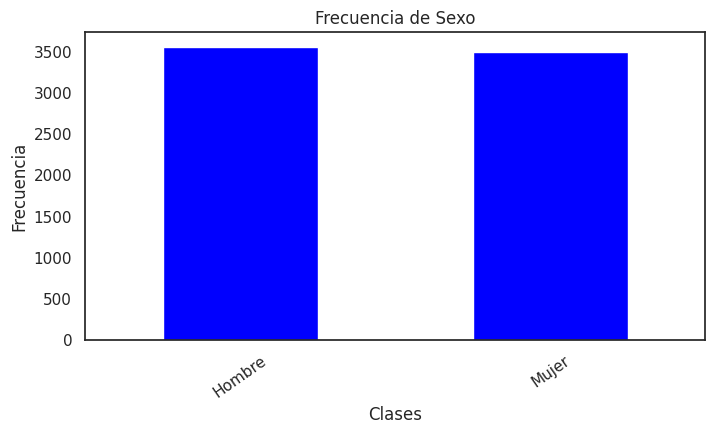

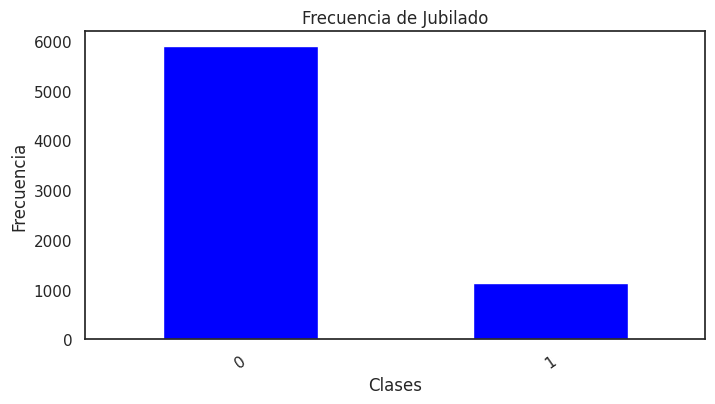

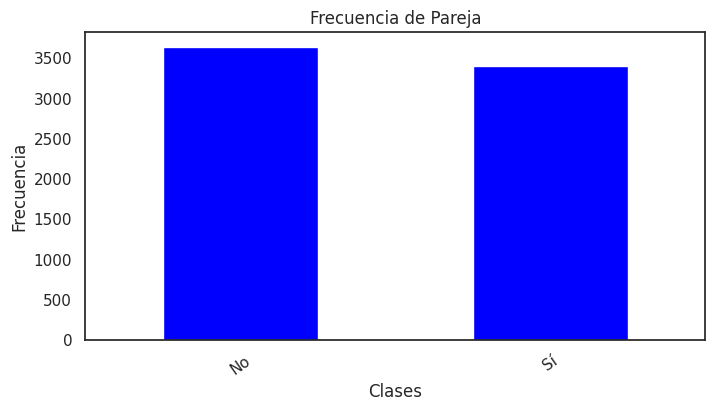

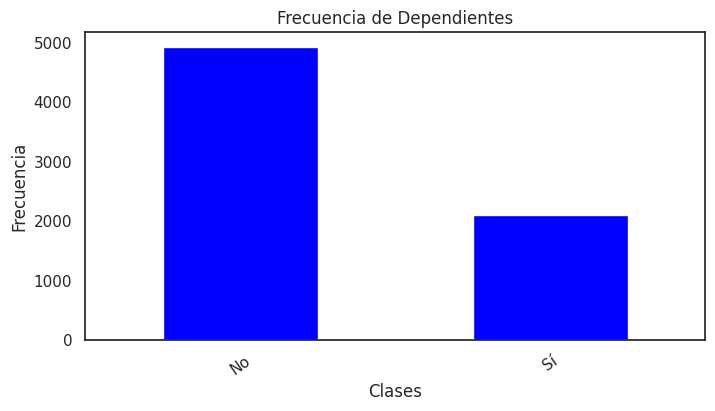

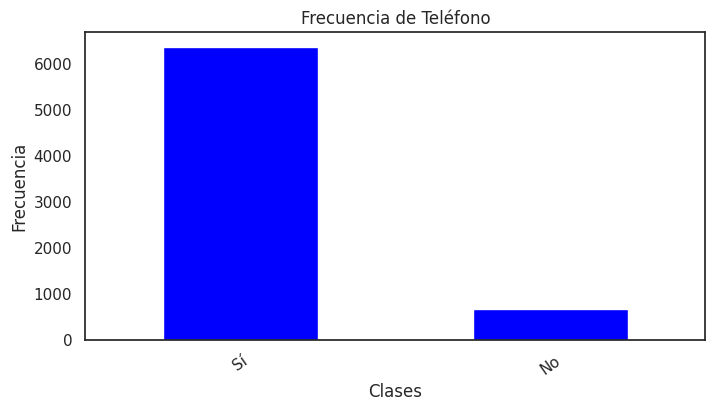

...

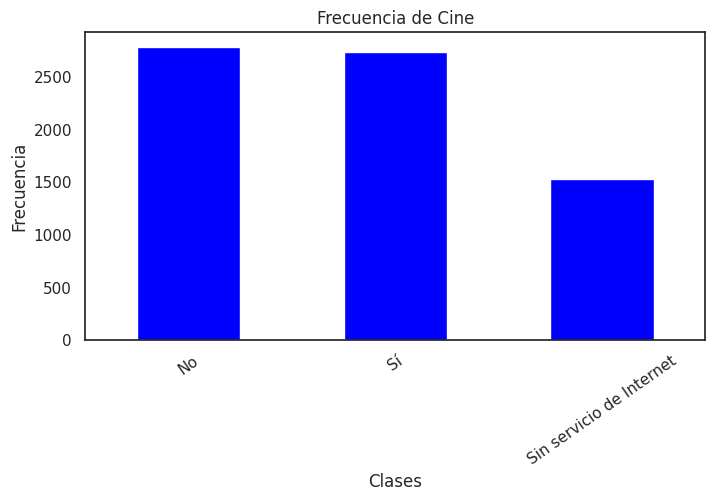

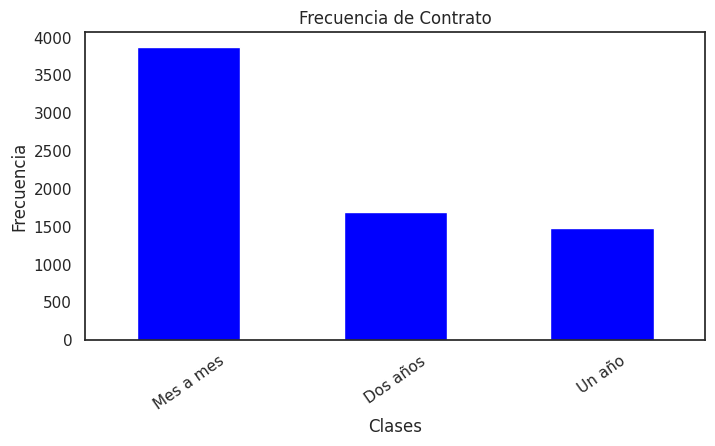

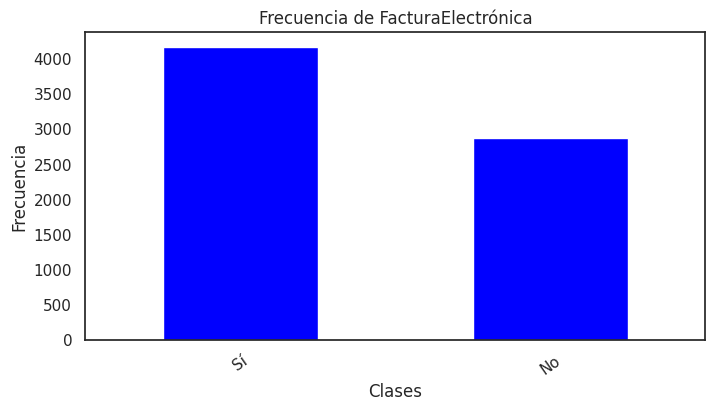

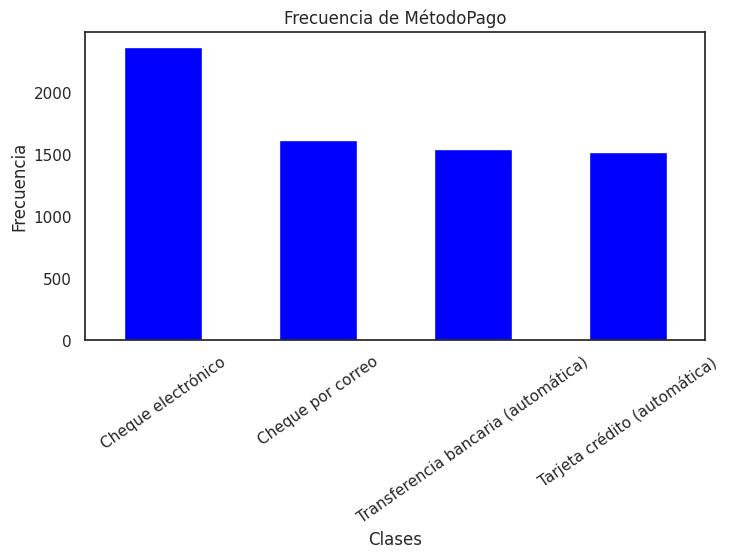

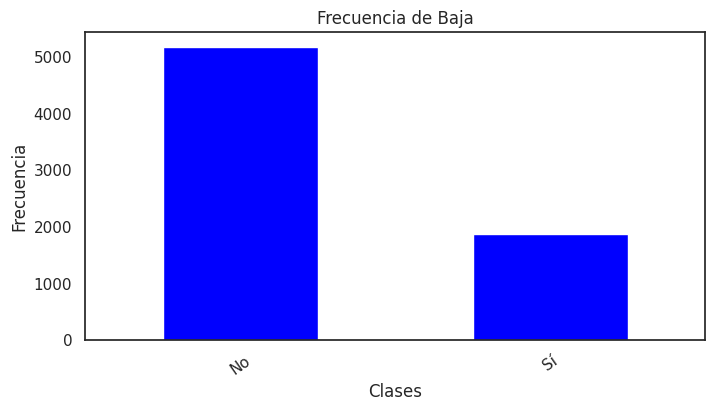

In [ ]:
for i in categoric_cols.columns:
  if i != 'IdCliente':
    plt.figure(figsize=(8,4))
    categoric_cols[i].value_counts().plot(kind='bar', color='blue')
    plt.title(f'Frecuencia de {i}')
    plt.xlabel('Clases')
    plt.ylabel('Frecuencia')
    plt.xticks(rotation = 35)

__Analisis de Variables Cuantitativas__

In [ ]:
cuantitative_cols = df.select_dtypes(include='number')
cuantitative_cols.describe().T

,count,mean,std,min,25%,50%,75%,max
Antigüedad,7043.00,32.37,24.56,0.00,9.00,29.00,55.00,72.00
CargoMensual,7043.00,64.76,30.09,18.25,35.50,70.35,89.85,118.75
TotalFacturado,7043.00,2279.73,2266.79,0.00,398.55,1394.55,3786.60,8684.80


Conozcamos la distribución de valores

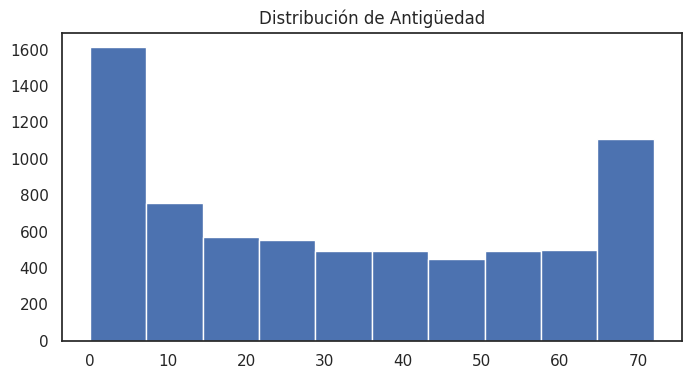

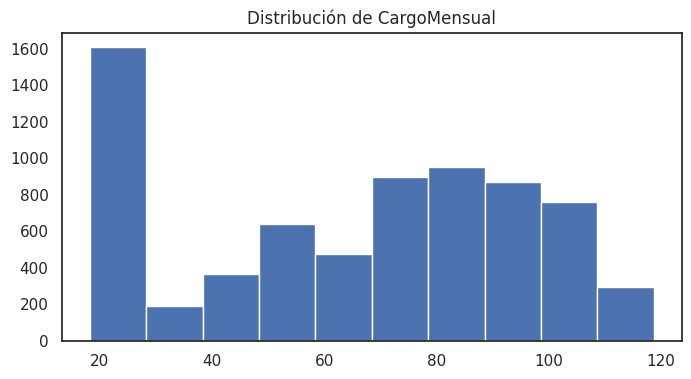

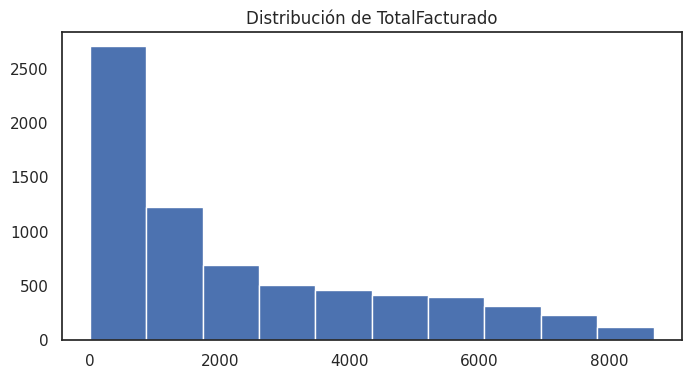

In [ ]:
for i in cuantitative_cols.columns:
  plt.figure(figsize=(8,4))
  plt.hist(cuantitative_cols[i])
  plt.title(f'Distribución de {i}')

### __2.2 Análisis Bivariante__

Vamos a realizar el análisis de cada variable frente a la variable objetivo __TotalFacturado__.

#### __2.2.1 Variables Cualitativas vs Variable Objetivo__

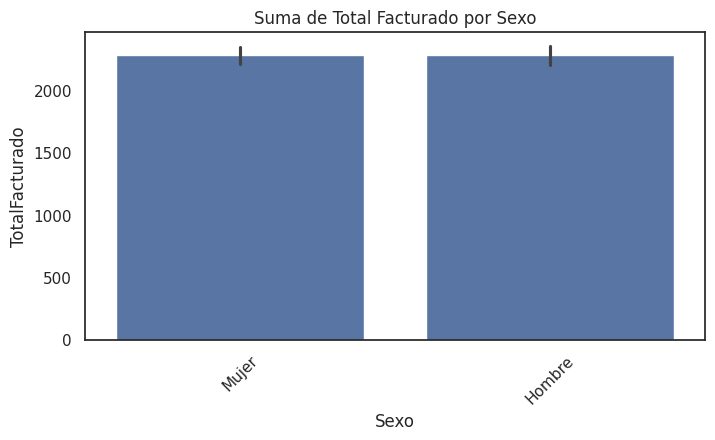

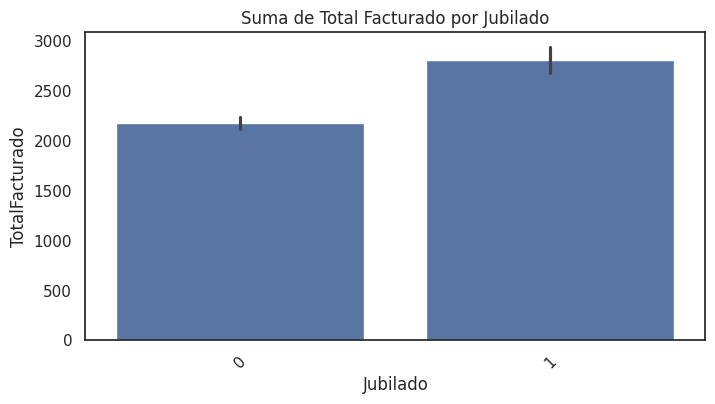

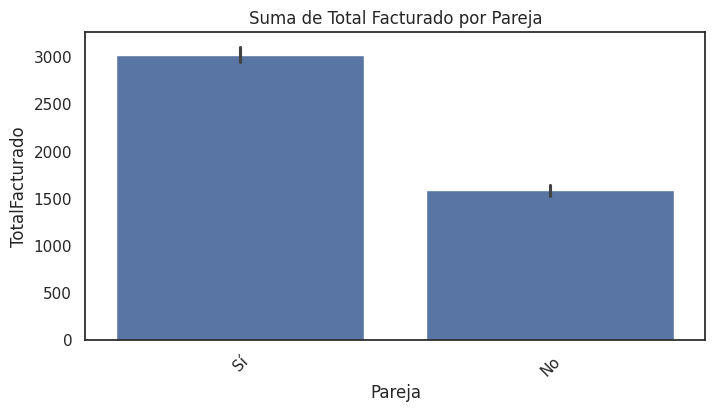

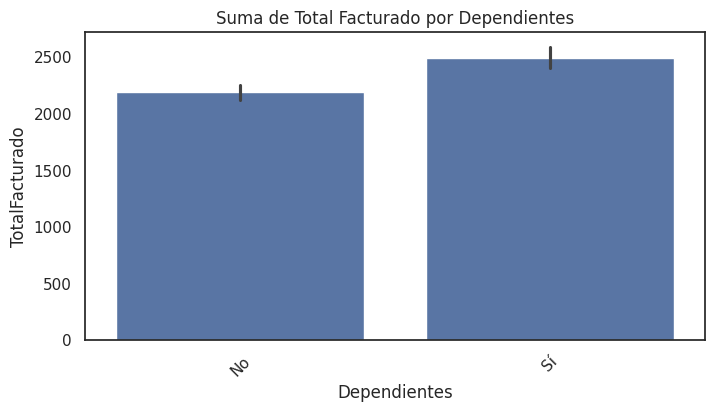

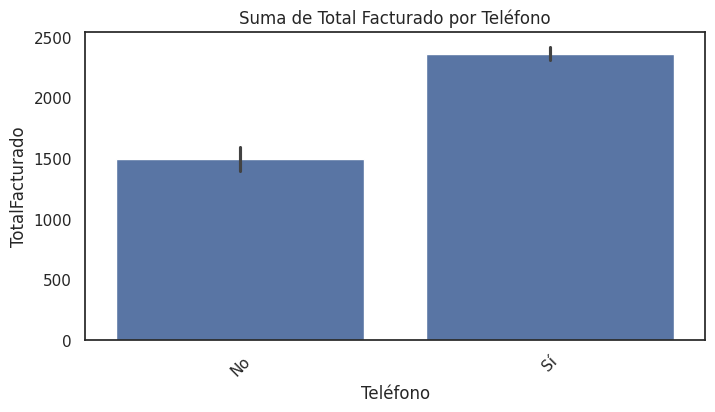

...

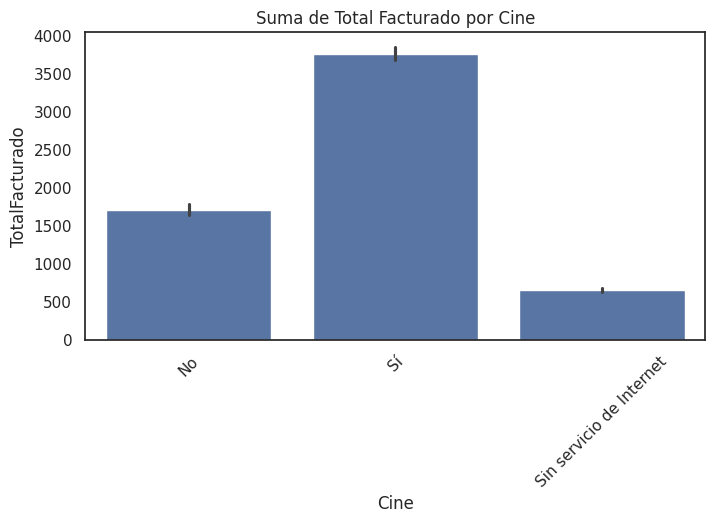

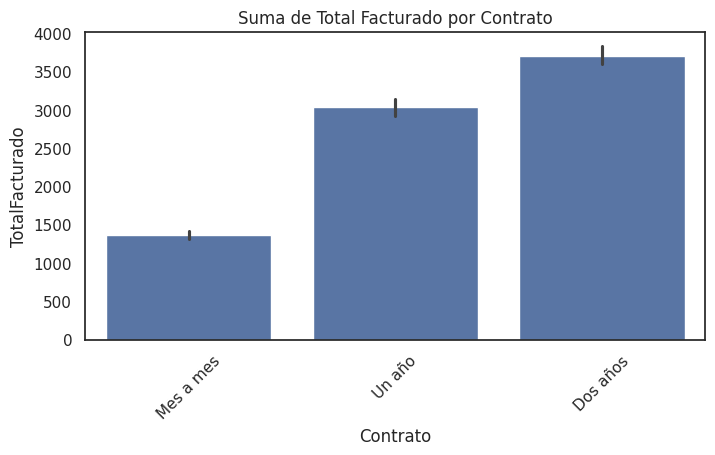

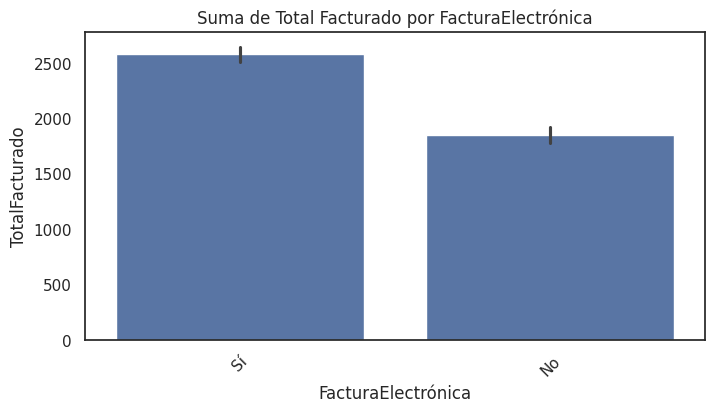

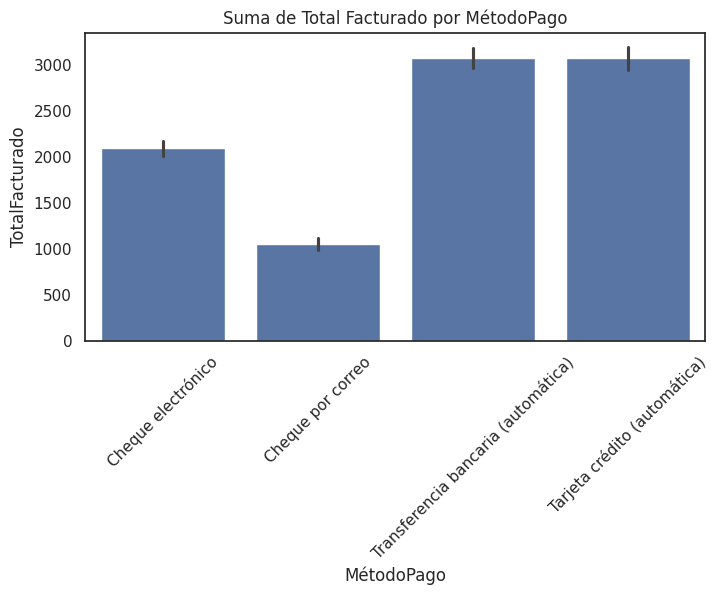

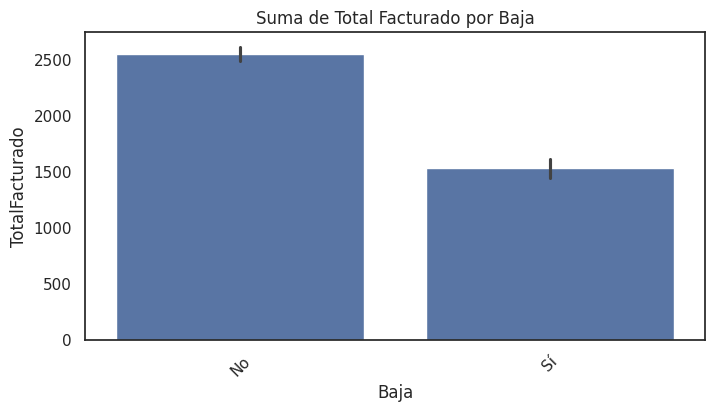

In [ ]:
exclusion_list = ['IdCliente', 'CargoMensual', 'Antigüedad', 'TotalFacturado']

# Iterar sobre las columnas del DataFrame
for i in df.columns:
    if i not in exclusion_list:
        plt.figure(figsize=(8, 4))
        sns.barplot(df, x=i, y='TotalFacturado')
        plt.title(f'Suma de Total Facturado por {i}')
        plt.xticks(rotation=45)

#### __2.2.2 Variables Cuantitativas vs Variable Objetivo__

Para conocer el comportamiento de nuestras variables cuantitativas frente a la variable objetivo vamos a utilizar ScatterPlot.

<Axes: xlabel='TotalFacturado', ylabel='Antigüedad'>

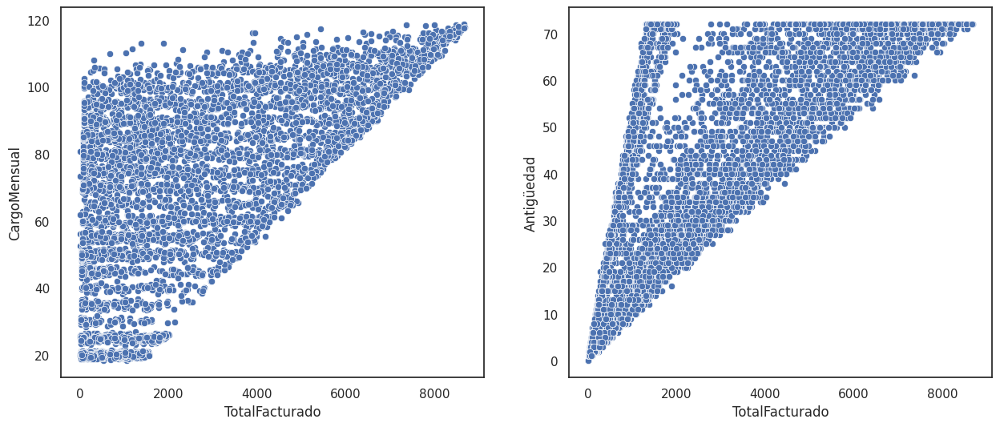

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15,6))
sns.scatterplot(df, x='TotalFacturado', y='CargoMensual', ax=axes[0])
sns.scatterplot(df, x='TotalFacturado', y='Antigüedad', ax=axes[1])

### __2.3 Análisis Multivariante__

<Axes: >

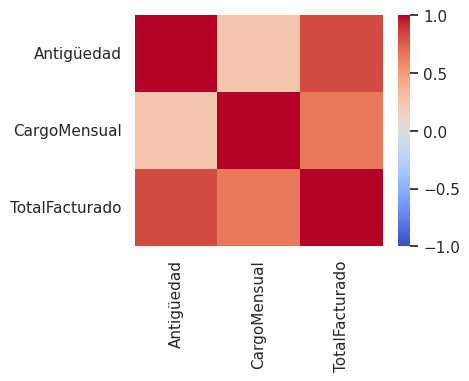

In [ ]:
corr = cuantitative_cols.corr()
plt.figure(figsize=(4, 3))
sns.heatmap(corr, cmap='coolwarm', vmin = -1, vmax = 1)

### __2.4 Calidad del Dato__

#### __2.4.1 Detectar valores nulos__

In [ ]:
# Confirmemos si tenemos algun valor nulo
df.isnull().sum()

IdCliente             0
Sexo                  0
Jubilado              0
Pareja                0
Dependientes          0
Antigüedad            0
Teléfono              0
MultiplesLíneas       0
Internet              0
SeguridadOnline       0
BackupOnline          0
SeguroDispositivo     0
SoporteTécnico        0
Televisión            0
Cine                  0
Contrato              0
FacturaElectrónica    0
MétodoPago            0
CargoMensual          0
TotalFacturado        0
Baja                  0
dtype: int64

#### __2.4.2 Detectar valores atípicos__

<Axes: xlabel='TotalFacturado'>

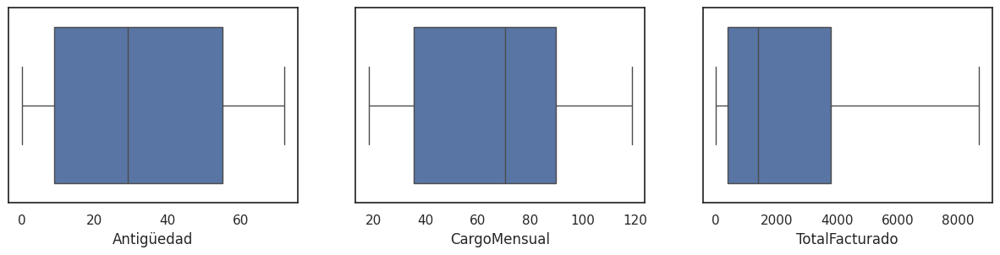

In [ ]:
 # Analizamos los valroes atípicos de nuestras variables cuantitativas
fig, axes = plt.subplots(figsize=(15,3), nrows=1, ncols=3)
sns.boxplot(x=df['Antigüedad'], ax=axes[0])
sns.boxplot(x=df['CargoMensual'], ax=axes[1])
sns.boxplot(x=df['TotalFacturado'], ax=axes[2])



### __3. Preparación de los Datos__

#### __3.1 Seleccionar los datos__

In [ ]:
# Seleccionamos las variables que son de nuestro interés. En este caso vamos a descartar el campo IdCliente.
df = df.drop(['IdCliente'], axis=1)
df.columns


Index(['Sexo', 'Jubilado', 'Pareja', 'Dependientes', 'Antigüedad', 'Teléfono',
       'MultiplesLíneas', 'Internet', 'SeguridadOnline', 'BackupOnline',
       'SeguroDispositivo', 'SoporteTécnico', 'Televisión', 'Cine', 'Contrato',
       'FacturaElectrónica', 'MétodoPago', 'CargoMensual', 'TotalFacturado',
       'Baja'],
      dtype='object')

#### __3.2 Limpieza de datos__

##### __3.2.1 Eliminar nulos__

In [ ]:
#Aunque ya conocemos que no hay nulos, esta sería la manera en la que se eliminarían
df = df.dropna()

In [ ]:
#Aprovechamos y formateamos algunas variables en el tipo de dato preferido
df.dtypes

Sexo                   object
Jubilado               object
Pareja                 object
Dependientes           object
Antigüedad              int64
Teléfono               object
MultiplesLíneas        object
Internet               object
SeguridadOnline        object
BackupOnline           object
SeguroDispositivo      object
SoporteTécnico         object
Televisión             object
Cine                   object
Contrato               object
FacturaElectrónica     object
MétodoPago             object
CargoMensual          float64
TotalFacturado        float64
Baja                   object
dtype: object

#### __3.2.2 Eliminar duplicados__

In [ ]:
print(f"Número de filas: {df.shape[0]}")
print(f"Número de columnas: {df.shape[1]}")
print()
print("Eliminando filas con valores duplicados...")
df = df.drop_duplicates()
print()
print(f"Número de filas: {df.shape[0]}")
print(f"Número de columnas: {df.shape[1]}")


Número de filas: 7043
Número de columnas: 20

Eliminando filas con valores duplicados...

Número de filas: 7021
Número de columnas: 20


#### __3.2.3 Eliminar valores atípicos__

In [ ]:
columns = ['Antigüedad', 'CargoMensual', 'TotalFacturado']
print('Número de filas incluyendo datos atípicos:', df.shape[0])
print('Eliminando datos atípicos...')
Q1 = df[columns].quantile(0.25)
Q3 = df[columns].quantile(0.75)
IQR = Q3 - Q1

lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

df_result = df[~((df[columns] < lower | (df[columns] > upper))).any(axis=1)]

print('Numero de filas sin datos atípicos:', df_result.shape[0])


Número de filas incluyendo datos atípicos: 7021
Eliminando datos atípicos...
Numero de filas sin datos atípicos: 7010


### __3.3 Formateo__

Nuestros modelos de machine learning necesitan que todas las variables estén en tipo numéricas para funcionar, para ello utilizaremos get_dummies()

In [ ]:
categoric_cols_ = df_result.select_dtypes(include='object')

# Crear variables dummy para las columnas categóricas
dummies = pd.get_dummies(df_result[categoric_cols_.columns], drop_first=True)
dummies = dummies.astype(int)

# Eliminar las columnas originales categóricas del DataFrame
df_result.drop(categoric_cols_.columns, axis=1, inplace=True)

# Concatenar el DataFrame original con las nuevas columnas dummy
df_result = pd.concat([df_result, dummies], axis=1)

df_result



<ipython-input-99-47288723614e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result.drop(categoric_cols_.columns, axis=1, inplace=True)


,Antigüedad,CargoMensual,TotalFacturado,Sexo_Mujer,Jubilado_1,Pareja_Sí,Dependientes_Sí,Teléfono_Sí,MultiplesLíneas_Sin servicio de telefonía,MultiplesLíneas_Sí,...,Televisión_Sí,Cine_Sin servicio de Internet,Cine_Sí,Contrato_Mes a mes,Contrato_Un año,FacturaElectrónica_Sí,MétodoPago_Cheque por correo,MétodoPago_Tarjeta crédito (automática),MétodoPago_Transferencia bancaria (automática),Baja_Sí
0,1,29.85,29.85,1,0,1,0,0,1,0,...,0,0,0,1,0,1,0,0,0,0
1,34,56.95,1889.50,0,0,0,0,1,0,0,...,0,0,0,0,1,0,1,0,0,0
2,2,53.85,108.15,0,0,0,0,1,0,0,...,0,0,0,1,0,1,1,0,0,1
3,45,42.30,1840.75,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
4,2,70.70,151.65,1,0,0,0,1,0,0,...,0,0,0,1,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,24,84.80,1990.50,0,0,1,1,1,0,1,...,1,0,1,0,1,1,1,0,0,0
7039,72,103.20,7362.90,1,0,1,1,1,0,1,...,1,0,1,0,1,1,0,1,0,0
7040,11,29.60,346.45,1,0,1,1,0,1,0,...,0,0,0,1,0,1,0,0,0,0
7041,4,74.40,306.60,0,1,1,0,1,0,1,...,0,0,0,1,0,1,1,0,0,1


In [ ]:
# Solo faltaria normalizar la variable Antigüedad
scaler = MinMaxScaler()
df_result[['Antigüedad']] = scaler.fit_transform(df_result[['Antigüedad']])
data_table.DataTable(df_result, include_index=False, num_rows_per_page=5)

,Antigüedad,CargoMensual,TotalFacturado,Sexo_Mujer,Jubilado_1,Pareja_Sí,Dependientes_Sí,Teléfono_Sí,MultiplesLíneas_Sin servicio de telefonía,MultiplesLíneas_Sí,...,Televisión_Sí,Cine_Sin servicio de Internet,Cine_Sí,Contrato_Mes a mes,Contrato_Un año,FacturaElectrónica_Sí,MétodoPago_Cheque por correo,MétodoPago_Tarjeta crédito (automática),MétodoPago_Transferencia bancaria (automática),Baja_Sí
0,0.00,29.85,29.85,1,0,1,0,0,1,0,...,0,0,0,1,0,1,0,0,0,0
1,0.46,56.95,1889.50,0,0,0,0,1,0,0,...,0,0,0,0,1,0,1,0,0,0
2,0.01,53.85,108.15,0,0,0,0,1,0,0,...,0,0,0,1,0,1,1,0,0,1
3,0.62,42.30,1840.75,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
4,0.01,70.70,151.65,1,0,0,0,1,0,0,...,0,0,0,1,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0.32,84.80,1990.50,0,0,1,1,1,0,1,...,1,0,1,0,1,1,1,0,0,0
7039,1.00,103.20,7362.90,1,0,1,1,1,0,1,...,1,0,1,0,1,1,0,1,0,0
7040,0.14,29.60,346.45,1,0,1,1,0,1,0,...,0,0,0,1,0,1,0,0,0,0
7041,0.04,74.40,306.60,0,1,1,0,1,0,1,...,0,0,0,1,0,1,1,0,0,1


<Axes: >

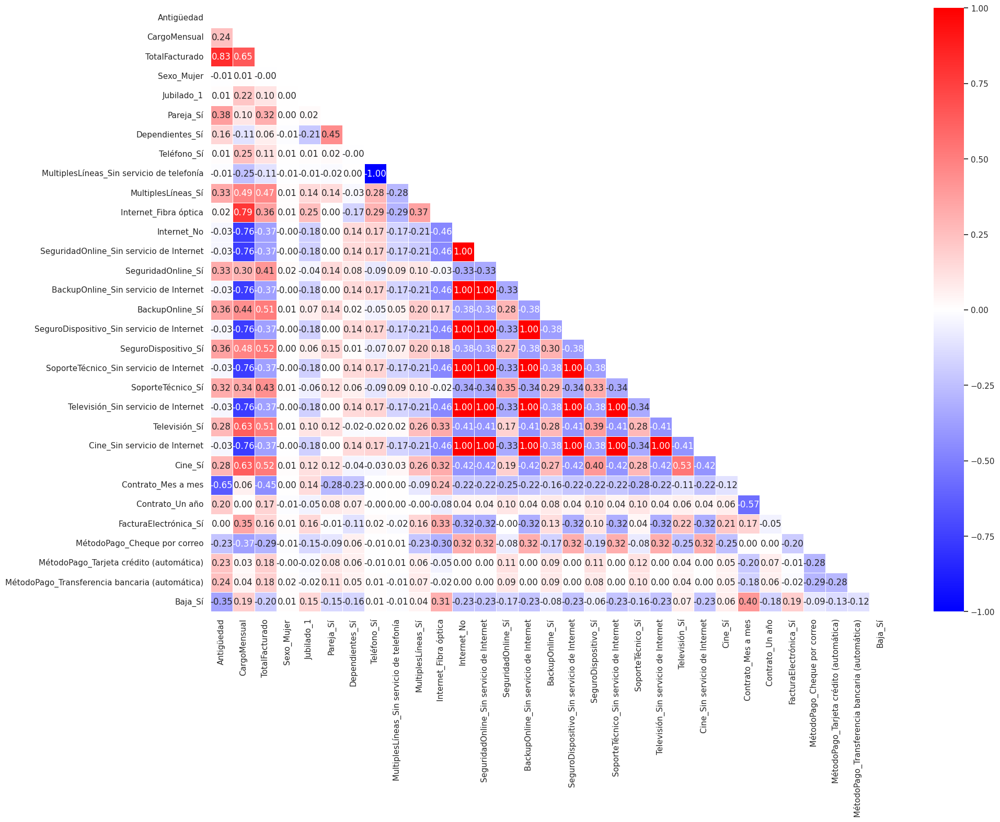

In [ ]:
corr = df_result.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(21,15))

sns.heatmap(corr, mask=mask, cmap='bwr', annot=True, fmt=".2f", linewidths=.5)



In [ ]:
'''Ahora empezaremos a detectar variables que tienen mas de 0.85 o menos de -0.85 de correlación para evitar problemas de multicolinealidad.
Eliminamos estas orimero, y vemos como queda la correlacion'''
result12 = df_result.drop(columns=['MultiplesLíneas_Sin servicio de telefonía', 'SeguridadOnline_Sin servicio de Internet',
                                   'BackupOnline_Sin servicio de Internet', 'SeguroDispositivo_Sin servicio de Internet',
                                   'SoporteTécnico_Sin servicio de Internet', 'Televisión_Sin servicio de Internet', 'Cine_Sin servicio de Internet'])

In [ ]:
corr_new = result12.corr()

'\nComo podemos ver ya no tenemos variables altamente correladas por lo que no tendremos problemasde multicolinealidad\n'

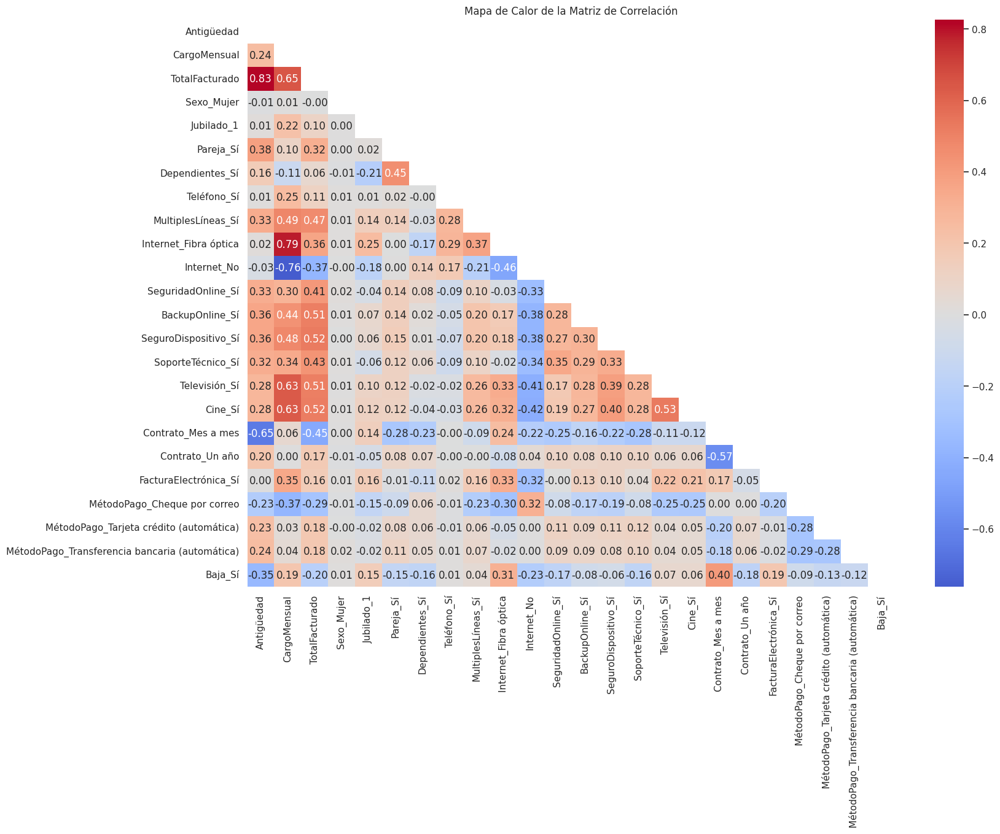

In [ ]:
mask = np.triu(np.ones_like(corr_new, dtype=bool))
plt.figure(figsize=(17, 12))
sns.heatmap(corr_new, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0)

plt.title('Mapa de Calor de la Matriz de Correlación')
'''
Como podemos ver ya no tenemos variables altamente correladas por lo que no tendremos problemasde multicolinealidad
'''

Como queremos estimar una variable cuantitativa "TotalFacturado", lo que tenemos es un problema de regresion. Usando el cheat sheet de Scikit-Learn podemos confirmarlo.

# __4. Modelado y Evaluación__

### __4.1 Regresión Lineal Múltiple__



In [ ]:
df = result12
# Cogemos todas las variables explicativas

X = df.drop(columns = 'TotalFacturado')
Y = df['TotalFacturado']

# Normalizamos las variables para interpretar mejor el resultado
scaler = MinMaxScaler()
scaled_features = scaler.fit_transform(X.values)
X = pd.DataFrame(scaled_features, index=X.index, columns=X.columns)
y = scaler.fit_transform(df[['TotalFacturado']])

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=1234, shuffle=True)

#Creación y entrenamiento del modelo
modelo = linear_model.LinearRegression()
modelo.fit(X = X_train, y = y_train)



LinearRegression()

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22],
 [Text(0, 0, 'Antigüedad'),
  Text(1, 0, 'CargoMensual'),
  Text(2, 0, 'Sexo_Mujer'),
  Text(3, 0, 'Jubilado_1'),
  Text(4, 0, 'Pareja_Sí'),
  Text(5, 0, 'Dependientes_Sí'),
  Text(6, 0, 'Teléfono_Sí'),
  Text(7, 0, 'MultiplesLíneas_Sí'),
  Text(8, 0, 'Internet_Fibra óptica'),
  Text(9, 0, 'Internet_No'),
  Text(10, 0, 'SeguridadOnline_Sí'),
  Text(11, 0, 'BackupOnline_Sí'),
  Text(12, 0, 'SeguroDispositivo_Sí'),
  Text(13, 0, 'SoporteTécnico_Sí'),
  Text(14, 0, 'Televisión_Sí'),
  Text(15, 0, 'Cine_Sí'),
  Text(16, 0, 'Contrato_Mes a mes'),
  Text(17, 0, 'Contrato_Un año'),
  Text(18, 0, 'FacturaElectrónica_Sí'),
  Text(19, 0, 'MétodoPago_Cheque por correo'),
  Text(20, 0, 'MétodoPago_Tarjeta crédito (automática)'),
  Text(21, 0, 'MétodoPago_Transferencia bancaria (automática)'),
  Text(22, 0, 'Baja_Sí')])

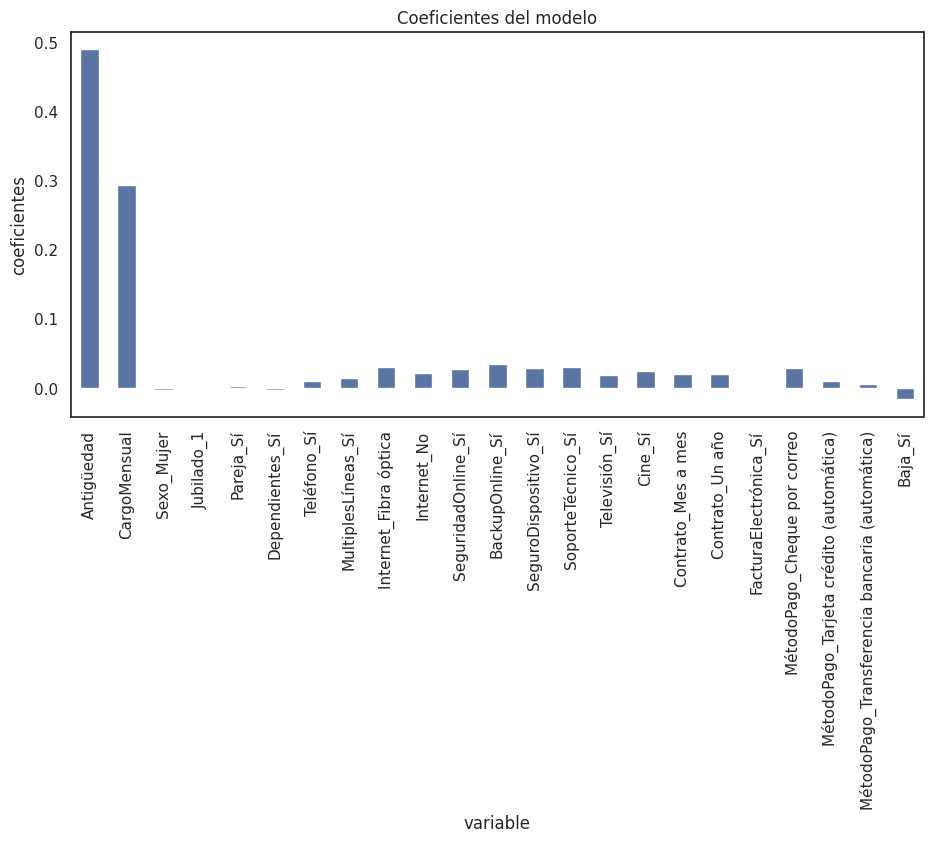

In [ ]:
#Coeficientes del modelo
df_coeficientes = pd.DataFrame({'predictor': X_train.columns, 'coef':modelo.coef_.flatten()})

plt.figure(figsize=(11, 5))
sns.barplot(df_coeficientes, x='predictor', y='coef', width=0.5)
plt.title('Coeficientes del modelo')
plt.xlabel('variable')
plt.ylabel('coeficientes')
plt.xticks(rotation=90)

Como se puede observar, además __"Antigüedad"__ la variable __"CargoMensual"__ es otra que tiene un gran impacto en nuestro objetivo __"TotalFacturado"__. El resto podríamos despreciar su contribución y eliminarlas. No obstante, vamos a ver si es sufieciente para mejorar el anterior modelo.

In [ ]:
# Evaluamos el modelo
y_pred = modelo.predict(X_test) #probamos ahora con el 30% restante que es el de test para predecir los valores de Y
y_pred = y_pred.flatten()
y_pred[:10]

#Cada uno de los valores de este array nos muetra una predicción de en que lugar se situa el totalfacturado predicho
#Un 0.481752 significa que predijo un valor que se encuentra aprox en la mitad entre el rango de valores de esat variable

array([ 0.48175289,  0.26209475,  0.40701761,  0.28583879,  0.19181327,
        0.28662966,  0.6701257 ,  0.15775777,  0.57030108, -0.0599508 ])

In [ ]:
print(f"Error cuadrático medio (MSE): {mean_squared_error(y_test, y_pred):.4f}")
print(f"Raíz del Error cuadrático medio (RMSE): {mean_squared_error(y_test, y_pred, squared=False):.4f}")
print(f"Coeficiente de determinación (R2): {r2_score(y_test, y_pred):.4f}")


Error cuadrático medio (MSE): 0.0064
Raíz del Error cuadrático medio (RMSE): 0.0803
Coeficiente de determinación (R2): 0.9037


Los valores indican un buen rendimiento del modelo: el MSE de 0.0064 y el RMSE de 0.0803 muestran que las predicciones son precisas con errores pequeños en la escala normalizada, y un R² de 0.9037 demuestra que el modelo explica aproximadamente el 90.37% de la variabilidad en la variable objetivo, confirmando su efectividad en la predicción de los datos.

Text(0, 0.5, 'Facturación Real')

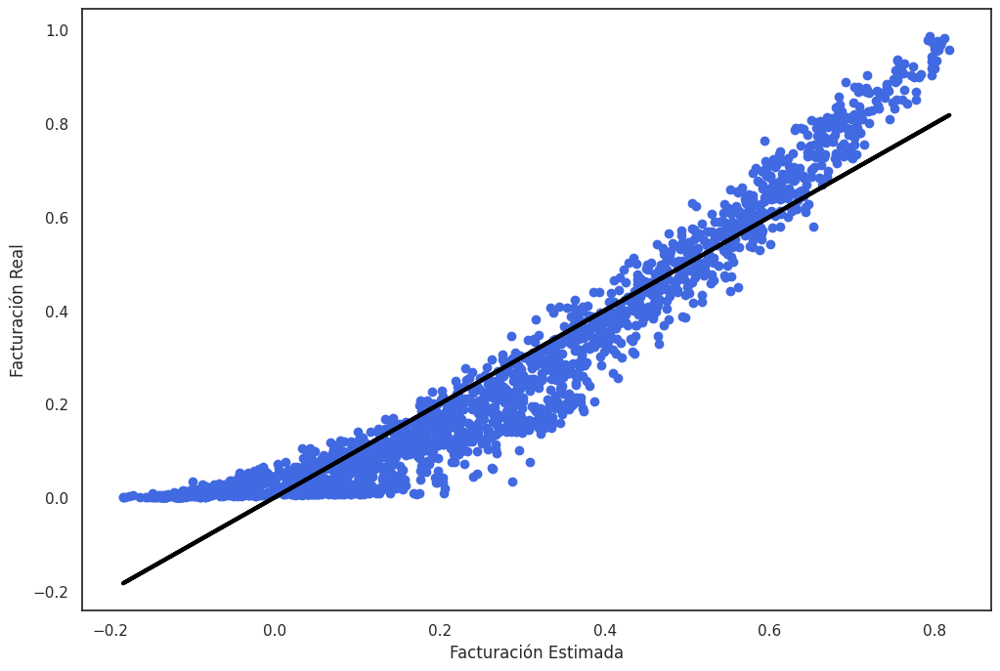

In [ ]:
plt.figure(figsize=(12,8))
plt.scatter(y_pred, y_test, color='royalblue')
plt.plot(y_pred, y_pred, color='black', linewidth=3)

plt.xlabel('Facturación Estimada')
plt.ylabel('Facturación Real')


Un ejemplo de interpretabilidad es que por ejemplo para un valor real de 0.50 normalizado en Y, nuestro modelo en promedio predice que toma un valor de 0.58 si tenemos en cuenta lo que nos dice nuestro RMSE. En el gráfico vemos que los resultados son muy buenos al tener un coeficiente de determinación tan cercano a 1. Veremos ahora regularizandolo por Ridge y Lasso a ver si se comporta mejor

### __4.2 Regularización de Ridge__

In [ ]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
# Por defecto RidgeCV utiliza el mean squared error
modelo = linear_model.RidgeCV(
            fit_intercept   = True,
            store_cv_values = True
         )

_ = modelo.fit(X_train, y_train)

y_pred = modelo.predict(X_test)
y_pred = y_pred.flatten()
y_pred[:10]

print("")
print(f"Error cuadrático medio (MSE): {mean_squared_error(y_test, y_pred):.4f}")
print(f"Raíz del Error cuadrático medio (MSE): {mean_squared_error(y_test, y_pred,squared=False):.4f}")
print(f"Coeficiente de determinación (R2): {r2_score(y_test, y_pred):.4f}")



Error cuadrático medio (MSE): 0.0065
Raíz del Error cuadrático medio (MSE): 0.0803
Coeficiente de determinación (R2): 0.9036


Obtenemos el mismo resultado, parece ser que nuestro modelo no está ni sobreajustado ni tampoco contamos con variables que estén muy correladas entre sí.